# Predictive Model for Occurence Estimation

*Referneces*  
* [Hong Kong Map](https://data.gov.hk/en-data/dataset/hk-landsd-openmap-b50k-topographic-map-of-hong-kong)
* [Hong Kong Districts](https://opendata.esrichina.hk/datasets/esrihk::hong-kong-district-boundary/about)  
* [Occurence Data of Hong Kong Species](https://opendata.esrichina.hk/maps/esrihk::occurrence-data-of-hong-kong-species/about)

This specific notebook aims to train a predictive model that estimates the location and year of the occurences.

## Library

In [1]:
import numpy as np
import geopandas as gpd, pandas as pd
import shapely
import matplotlib.pyplot as plt
import rasterio, rasterstats
import contextily
import os

## Import Data

In [2]:
# Import Hong Kong map and district boundaries
hkmap = rasterio.open('hk.tif', mode='r+')
hkmap_array = hkmap.read(1)

districts = gpd.read_file('boundaries/Hong_Kong_District_Boundary.shp')
districts.to_crs(hkmap.crs, inplace=True)

# Import data from 2001 to 2024
def import_species_data(start_year=2001, end_year=2024, directory='species'):
    species_df = gpd.GeoDataFrame()
    for year in range(start_year, end_year + 1):
        file_path = os.path.join(directory, f'O{year}.shp')
        if os.path.exists(file_path):
            year_data = gpd.read_file(file_path, engine='pyogrio')
            year_data['year'] = year
            species_df = pd.concat([species_df, year_data], ignore_index=True)
        else:
            print(f"Warning: File {file_path} does not exist.")
    return species_df

species_df = import_species_data()
species_df.to_crs(hkmap.crs, inplace=True)

## Data Cleaning

In [3]:
species_df['date'] = pd.to_datetime(species_df['date'])
species_df['month'] = species_df['date'].dt.month
species_df.drop(columns=['OBJECTID', 'OBJECTID_1'], inplace=True)

## Exploratory Data Analysis

In [4]:
species_df = species_df.astype({'year': 'int32'})
species_df.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 422858 entries, 0 to 422857
Data columns (total 9 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   scientific  422858 non-null  object        
 1   family      422858 non-null  object        
 2   date        422858 non-null  datetime64[ns]
 3   gno         422858 non-null  int32         
 4   Shape__Are  422858 non-null  float64       
 5   Shape__Len  422858 non-null  float64       
 6   geometry    422858 non-null  geometry      
 7   year        422858 non-null  int32         
 8   month       422858 non-null  int32         
dtypes: datetime64[ns](1), float64(2), geometry(1), int32(3), object(2)
memory usage: 24.2+ MB


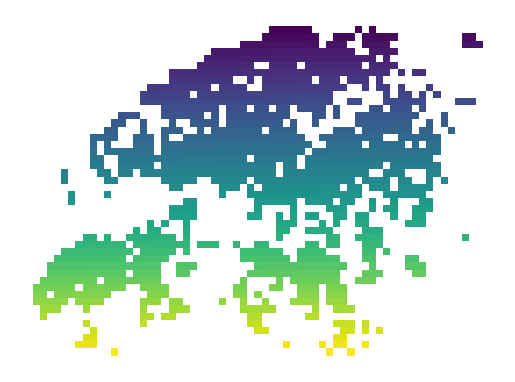

In [5]:
species_df.plot(column='gno')
plt.axis(False)
plt.show()

In [6]:
len(species_df['gno'].unique()) == len(species_df['geometry'].unique())

True

* The distribution of `gno` and the same unique number of `gno` and `geometry` indicate that these two columns share the same information regarding the location of the occurence.
    * They both can be used as *target value*. 
* Similarly, `Shape__Are` and `Shape__Len` will be removed due to duplicated information.
* Removing `date` due to redundancy.

In [7]:
species_df.drop(columns=['Shape__Are', 'Shape__Len', 'date'], inplace=True)
species_df.head(10)

,scientific,family,gno,geometry,year,month
0,Myrrophis chinensis,Homalopsidae,1575,"POLYGON Z ((833000.000 828000.001 0.000, 83400...",2001,7
1,Psammodynastes pulverulentus,Lamprophiidae,1657,"POLYGON Z ((845000.000 827000.001 0.000, 84600...",2001,7
2,Troides helena,Papilionidae,879,"POLYGON Z ((837000.000 838000.001 0.000, 83800...",2001,7
3,Viverricula indica,Viverridae,807,"POLYGON Z ((835000.000 839000.002 0.000, 83600...",2001,10
4,Muntiacus vaginalis,Cervidae,807,"POLYGON Z ((835000.000 839000.002 0.000, 83600...",2001,10
5,Viverricula indica,Viverridae,877,"POLYGON Z ((835000.000 838000.001 0.000, 83600...",2001,10
6,Muntiacus vaginalis,Cervidae,807,"POLYGON Z ((835000.000 839000.002 0.000, 83600...",2001,11
7,Viverricula indica,Viverridae,807,"POLYGON Z ((835000.000 839000.002 0.000, 83600...",2001,10
8,Viverricula indica,Viverridae,1447,"POLYGON Z ((845000.000 830000.001 0.000, 84600...",2001,10
9,Viverricula indica,Viverridae,1369,"POLYGON Z ((837000.000 831000.001 0.000, 83800...",2001,11


## Data Preprocessing

In [8]:
# Extract unique species names
species = sorted(species_df['scientific'].unique().tolist())

[260]
[1500, 1501, 1502, 1504, 1505, 1506, 1507, 1508, 1509, 1511, 1512, 1513, 1514, 1515, 1516, 1517, 1518, 1519, 1520, 1521, 1522, 1523, 1524, 1525, 1526, 1527, 1528, 1551, 1552, 1555, 1556, 1557, 1558, 1559, 1561, 1562, 1563, 1564, 1565, 1566, 1567, 1568, 1569, 1570, 1571, 1572, 1573, 1574, 1575, 1576, 1578, 1579, 1581, 1582, 1583, 1584, 1585, 1586, 1587, 1588, 1589, 1590, 1591, 1593, 1594, 1595, 1596, 1597, 1598, 1599]
[1617, 1622, 1623, 1625, 1626, 1628, 1629, 1630, 1631, 1632, 1633, 1634, 1635, 1636, 1637, 1638, 1639, 1640, 1641, 1642, 1643, 1644, 1645, 1646, 1648, 1649, 1650, 1651, 1652, 1653, 1654, 1655, 1656, 1657, 1658, 1659, 1662, 1663, 1664, 1668, 1669, 1687, 1693, 1694]


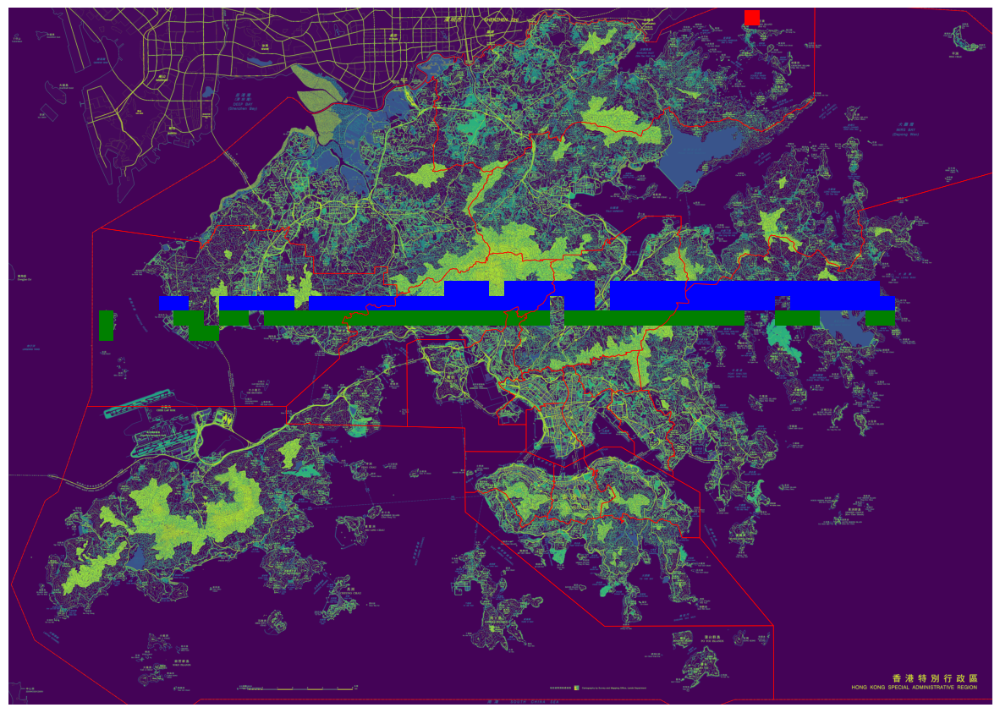

In [9]:
# Visualise samples to examine gno distribution
bound_left, bound_right, bound_top, bound_bottom = hkmap.bounds.left, hkmap.bounds.right, hkmap.bounds.top, hkmap.bounds.bottom
extent = (bound_left, bound_right, bound_bottom, bound_top)

gno_sample_2 = [gno for gno in sorted(species_df['gno'].unique().tolist()) if gno in [260]]
gno_sample_3 = [gno for gno in sorted(species_df['gno'].unique().tolist()) if gno in np.arange(1500, 1600)]
gno_sample_4 = [gno for gno in sorted(species_df['gno'].unique().tolist()) if gno in np.arange(1600, 1700)]
print(gno_sample_2)
print(gno_sample_3)
print(gno_sample_4)

fig, ax = plt.subplots(figsize=(15, 15))
ax.imshow(hkmap_array, extent=extent, origin='upper', vmin=hkmap_array.min(), vmax=hkmap_array.max())
districts.boundary.plot(ax=ax, color='red', linewidth=0.5)
species_df.loc[species_df['gno'].isin(gno_sample_2)].plot(ax=ax, color='red')
species_df.loc[species_df['gno'].isin(gno_sample_3)].plot(ax=ax, color='blue')
species_df.loc[species_df['gno'].isin(gno_sample_4)].plot(ax=ax, color='green')
ax.set_axis_off()
ax.set(xlim=(bound_left, bound_right), ylim=(bound_bottom, bound_top))
plt.show()

&emsp;The plot above shows that the `gno` values are arranged from 0 to the maximum number of pixel within the Hong Kong region. While the smallest value 0 starts at the top row and leftmost pixel of the region. The first two digits are **not** the row number. Therefore, `gno` cannot be easily converted into coordinates.

In [10]:
species_df['centroid'] = species_df['geometry'].centroid
species_df['x'] = species_df['centroid'].x
species_df['y'] = species_df['centroid'].y
species_df[['gno', 'centroid', 'x', 'y']].head()

,gno,centroid,x,y
0,1575,POINT (833500.000 827500.001),833500.000355,827500.001444
1,1657,POINT (845500.000 826500.001),845500.000372,826500.001455
2,879,POINT (837500.000 837500.001),837500.000426,837500.001460
3,807,POINT (835500.000 838500.002),835500.000413,838500.001508
4,807,POINT (835500.000 838500.002),835500.000413,838500.001508


801500.0004114339
803500.0004179936
804500.0004394505
805500.0004328473
806500.0004328745


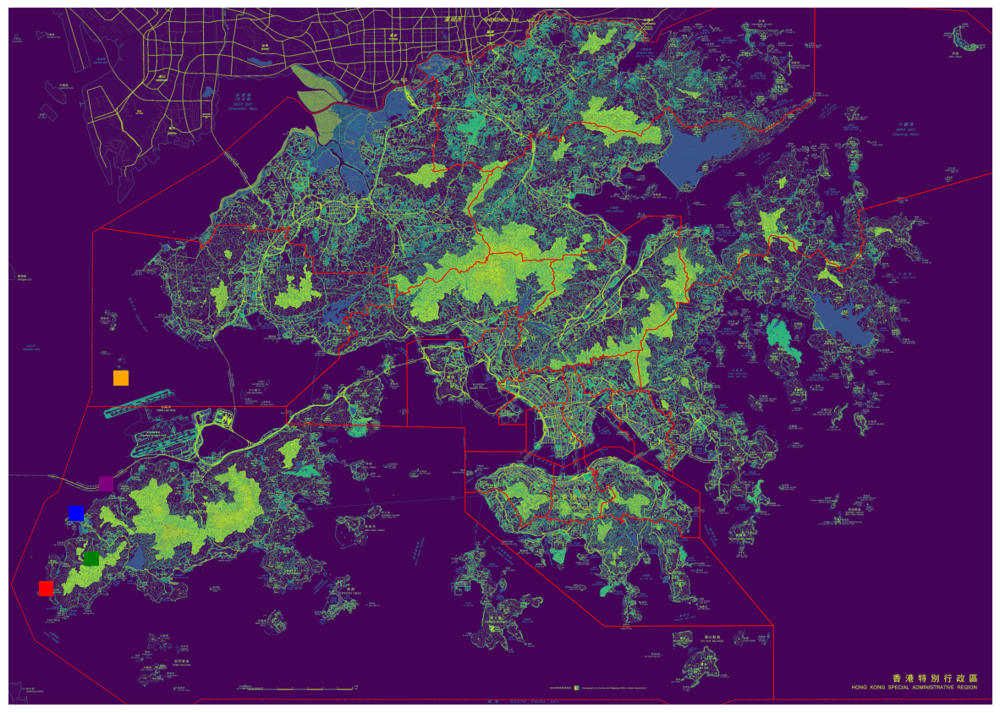

In [11]:
x_sample_1 = sorted(species_df['x'].unique().tolist())[0]
x_sample_2 = sorted(species_df['x'].unique().tolist())[9]
x_sample_3 = sorted(species_df['x'].unique().tolist())[19]
x_sample_4 = sorted(species_df['x'].unique().tolist())[29]
x_sample_5 = sorted(species_df['x'].unique().tolist())[39]
print(x_sample_1)
print(x_sample_2)
print(x_sample_3)
print(x_sample_4)
print(x_sample_5)

fig, ax = plt.subplots(figsize=(15, 15))
ax.imshow(hkmap_array, extent=extent, origin='upper', vmin=hkmap_array.min(), vmax=hkmap_array.max())
districts.boundary.plot(ax=ax, color='red', linewidth=0.5)
species_df.loc[species_df['x']==(x_sample_1)].plot(ax=ax, color='red')
species_df.loc[species_df['x']==(x_sample_2)].plot(ax=ax, color='blue')
species_df.loc[species_df['x']==(x_sample_3)].plot(ax=ax, color='green')
species_df.loc[species_df['x']==(x_sample_4)].plot(ax=ax, color='purple')
species_df.loc[species_df['x']==(x_sample_5)].plot(ax=ax, color='orange')
ax.set_axis_off()
ax.set(xlim=(bound_left, bound_right), ylim=(bound_bottom, bound_top))
plt.show()

&emsp;The `x` and `y` coordinates of the `centroids` can be used as predictive features to examine the neighbouring effect.

In [12]:
species_df.head(2)

,scientific,family,gno,geometry,year,month,centroid,x,y
0,Myrrophis chinensis,Homalopsidae,1575,"POLYGON Z ((833000.000 828000.001 0.000, 83400...",2001,7,POINT (833500.000 827500.001),833500.000355,827500.001444
1,Psammodynastes pulverulentus,Lamprophiidae,1657,"POLYGON Z ((845000.000 827000.001 0.000, 84600...",2001,7,POINT (845500.000 826500.001),845500.000372,826500.001455


### Grids of Hong Kong Map (20x20: 400 cells)

In [13]:
# Create bins using boundaries of Hong Kong map
x_bins = 20
y_bins = 20
x_bins = np.linspace(bound_left, bound_right, x_bins+1)
y_bins = np.linspace(bound_bottom, bound_top, y_bins+1)

species_df['x_bin'] = pd.cut(species_df['x'], bins=x_bins, labels=False)
species_df['y_bin'] = pd.cut(species_df['y'], bins=y_bins, labels=False)

species_df.head(2)

,scientific,family,gno,geometry,year,month,centroid,x,y,x_bin,y_bin
0,Myrrophis chinensis,Homalopsidae,1575,"POLYGON Z ((833000.000 828000.001 0.000, 83400...",2001,7,POINT (833500.000 827500.001),833500.000355,827500.001444,10,11
1,Psammodynastes pulverulentus,Lamprophiidae,1657,"POLYGON Z ((845000.000 827000.001 0.000, 84600...",2001,7,POINT (845500.000 826500.001),845500.000372,826500.001455,14,11


In [14]:
# Grid id assigned to each cell as target variable
def create_grid(x_bins=20, y_bins=20):
    grid_cells = []
    for i in range(y_bins):
        for j in range(x_bins):
            cell = {
                'y_bin': i,
                'x_bin': j,
                'id': i * x_bins + j
            }
            grid_cells.append(cell)
    return grid_cells

grid_cells = create_grid(x_bins=20, y_bins=20)

# Assign id to each occurrence record
def griding(x_bin, y_bin):
    for grid in grid_cells:
        if grid['x_bin'] == x_bin and grid['y_bin'] == y_bin:
            return grid['id']
    return None

species_df['grid_id'] = species_df.apply(lambda row: griding(row['x_bin'], row['y_bin']), axis=1)
species_df.head(5)

,scientific,family,gno,geometry,year,month,centroid,x,y,x_bin,y_bin,grid_id
0,Myrrophis chinensis,Homalopsidae,1575,"POLYGON Z ((833000.000 828000.001 0.000, 83400...",2001,7,POINT (833500.000 827500.001),833500.000355,827500.001444,10,11,230
1,Psammodynastes pulverulentus,Lamprophiidae,1657,"POLYGON Z ((845000.000 827000.001 0.000, 84600...",2001,7,POINT (845500.000 826500.001),845500.000372,826500.001455,14,11,234
2,Troides helena,Papilionidae,879,"POLYGON Z ((837000.000 838000.001 0.000, 83800...",2001,7,POINT (837500.000 837500.001),837500.000426,837500.001460,11,15,311
3,Viverricula indica,Viverridae,807,"POLYGON Z ((835000.000 839000.002 0.000, 83600...",2001,10,POINT (835500.000 838500.002),835500.000413,838500.001508,11,16,331
4,Muntiacus vaginalis,Cervidae,807,"POLYGON Z ((835000.000 839000.002 0.000, 83600...",2001,10,POINT (835500.000 838500.002),835500.000413,838500.001508,11,16,331


In [15]:
grid_cells

[{'y_bin': 0, 'x_bin': 0, 'id': 0},
 {'y_bin': 0, 'x_bin': 1, 'id': 1},
 {'y_bin': 0, 'x_bin': 2, 'id': 2},
 {'y_bin': 0, 'x_bin': 3, 'id': 3},
 {'y_bin': 0, 'x_bin': 4, 'id': 4},
 {'y_bin': 0, 'x_bin': 5, 'id': 5},
 {'y_bin': 0, 'x_bin': 6, 'id': 6},
 {'y_bin': 0, 'x_bin': 7, 'id': 7},
 {'y_bin': 0, 'x_bin': 8, 'id': 8},
 {'y_bin': 0, 'x_bin': 9, 'id': 9},
 {'y_bin': 0, 'x_bin': 10, 'id': 10},
 {'y_bin': 0, 'x_bin': 11, 'id': 11},
 {'y_bin': 0, 'x_bin': 12, 'id': 12},
 {'y_bin': 0, 'x_bin': 13, 'id': 13},
 {'y_bin': 0, 'x_bin': 14, 'id': 14},
 {'y_bin': 0, 'x_bin': 15, 'id': 15},
 {'y_bin': 0, 'x_bin': 16, 'id': 16},
 {'y_bin': 0, 'x_bin': 17, 'id': 17},
 {'y_bin': 0, 'x_bin': 18, 'id': 18},
 {'y_bin': 0, 'x_bin': 19, 'id': 19},
 {'y_bin': 1, 'x_bin': 0, 'id': 20},
 {'y_bin': 1, 'x_bin': 1, 'id': 21},
 {'y_bin': 1, 'x_bin': 2, 'id': 22},
 {'y_bin': 1, 'x_bin': 3, 'id': 23},
 {'y_bin': 1, 'x_bin': 4, 'id': 24},
 {'y_bin': 1, 'x_bin': 5, 'id': 25},
 {'y_bin': 1, 'x_bin': 6, 'id': 26},
 

In [16]:
# Boxes for each grid cell
grid_cells_boxes = []
for cell in grid_cells:
    x_min = x_bins[cell['x_bin']]
    x_max = x_bins[cell['x_bin'] + 1]
    y_min = y_bins[cell['y_bin']]
    y_max = y_bins[cell['y_bin'] + 1]
    box = shapely.geometry.box(x_min, y_min, x_max, y_max)
    grid_cells_boxes.append(box)

grid_cells_boxes

[<POLYGON ((802272 800790, 802272 803108, 799000 803108, 799000 800790, 80227...>,
 <POLYGON ((805544 800790, 805544 803108, 802272 803108, 802272 800790, 80554...>,
 <POLYGON ((808816 800790, 808816 803108, 805544 803108, 805544 800790, 80881...>,
 <POLYGON ((812088 800790, 812088 803108, 808816 803108, 808816 800790, 81208...>,
 <POLYGON ((815360 800790, 815360 803108, 812088 803108, 812088 800790, 81536...>,
 <POLYGON ((818632 800790, 818632 803108, 815360 803108, 815360 800790, 81863...>,
 <POLYGON ((821904 800790, 821904 803108, 818632 803108, 818632 800790, 82190...>,
 <POLYGON ((825176 800790, 825176 803108, 821904 803108, 821904 800790, 82517...>,
 <POLYGON ((828448 800790, 828448 803108, 825176 803108, 825176 800790, 82844...>,
 <POLYGON ((831720 800790, 831720 803108, 828448 803108, 828448 800790, 83172...>,
 <POLYGON ((834992 800790, 834992 803108, 831720 803108, 831720 800790, 83499...>,
 <POLYGON ((838264 800790, 838264 803108, 834992 803108, 834992 800790, 83826...>,
 <PO

In [17]:
def species_layer(species_df):
    species_layers = {}
    for s in species:
        layer = np.zeros((len(np.arange(2001, 2025)), 20, 20), dtype=int)
        species_data = species_df[species_df['scientific'] == s]
        for _, row in species_data.iterrows():
            if pd.notnull(row['x_bin']) and pd.notnull(row['y_bin']):
                layer[row['year'] - 2001, 19 - int(row['y_bin']), int(row['x_bin'])] += 1
        species_layers[s] = layer
    return species_layers

species_layers = species_layer(species_df)

## Deep Neural Network

In [18]:
import torch
import torch.nn as nn

class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        # First fully connected layer: from 400 (20x20) to 512 neurons
        self.fc1 = nn.Linear(20 * 20, 512)
        # Second fully connected layer: from 512 to (20x20: 400) neurons
        self.fc2 = nn.Linear(512, 400)

    def forward(self, x):
        # Flatten the image input
        x = x.view(-1, 20 * 20)
        # Apply the first FC layer and sigmoid activation
        x = self.fc1(x)
        x = torch.sigmoid(x)
        # Apply the second FC layer (output layer)
        x = self.fc2(x)
        
        return x

In [19]:
def train_model(species):
    # Initialize the network and print its architecture
    model = Net()
    print(model)

    # Specify loss function and optimizer
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr=0.01)

    # Define device
    device = torch.device('mpu' if torch.cuda.is_available() else 'cpu')

    # Specify species for training and inference
    species_layer = species_layers[species]
    X = torch.tensor(species_layer[:23, :, :]).reshape(23, -1).to(torch.float32)
    y = torch.tensor(species_layer[1:24, :, :]).reshape(23, -1).to(torch.float32)
    print("X_train", X.shape)
    print("y_train", y.shape)

    # Number of epochs for training
    n_epochs = 5  # For a faster demo; consider using between 20-50 epochs for real training
    model.train()  # Set the model to training mode
    for epoch in range(n_epochs):
        train_loss = 0.0
        
        # Train the model on each batch
        data, target = X.to(device), y.to(device)  # Move data to GPU if available
        optimizer.zero_grad()         # Clear gradients
        output = model(data)            # Forward pass
        loss = criterion(output, target)  # Calculate loss
        loss.backward()                 # Backward pass
        optimizer.step()                # Update parameters
        train_loss += loss.item()# * data.size(0)  # Accumulate loss
        
        # Calculate average loss over the epoch
        # train_loss = train_loss / len(train_loader.dataset)
        print('Epoch: {} \tTraining Loss: {:.6f}'.format(epoch+1, train_loss))

    return model

In [20]:
# NOT USED YET
# Visualise predicted grid cells with intensity
def inference_model(species, model):
    # model.eval()
    # with torch.no_grad():
    #     for i in range(23):
    #         test_data = torch.tensor(abisara_echerius_layer[i, :, :]).unsqueeze(0).to(torch.float32).to(device)
    #         test_output = model(test_data)
    #         predicted_grid = test_output.cpu().numpy().reshape(20, 20)

    # Inference on the last layer (2024)
    species_layer = species_layers[species]
    # Define device
    device = torch.device('mpu' if torch.cuda.is_available() else 'cpu')
    model.eval()
    with torch.no_grad():
        test_data = torch.tensor(species_layer[-1, :, :]).unsqueeze(0).to(torch.float32).to(device)
        test_output = model(test_data)
        predicted_grid = test_output.cpu().numpy()
        predicted_grid = predicted_grid.reshape(20, 20)
        # predicted_grid = np.round(predicted_grid)

    # Create a GeoDataFrame - each row contains grid id, geometry (box), and prediction (0 for now)
    grid_cells_boxes_species = []
    for i in range(400):
        grid_cells_boxes_species.append({'id': i,
                                         'geometry': grid_cells_boxes[i],
                                         'prediction': 0})

    # Add prediction count
    for i in range(20): # y
        for j in range(20): # x
            if predicted_grid[predicted_grid.shape[0]-1-i, j] > 1:
                grid_cells_boxes_species[i * 20 + j]['prediction'] += 1
    for i in range(400):
        if grid_cells_boxes_species[i]['prediction'] < 0:
            grid_cells_boxes_species[i]['prediction'] = 0

    # Turn into GeoDataFrame
    grid_cells_gdf = gpd.GeoDataFrame(grid_cells_boxes_species, crs=hkmap.crs, geometry='geometry')

    # Visualise the centroids on the map
    fig, ax = plt.subplots(figsize=(15, 15))
    ax.imshow(hkmap_array, extent=extent, origin='upper', vmin=hkmap_array.min(), vmax=hkmap_array.max())
    districts.boundary.plot(ax=ax, color='red', linewidth=0.5)
    grid_cells_gdf.plot(ax=ax, linewidth=.1, column='prediction', cmap='YlOrRd', alpha=.3, legend=True) # facecolor='yellow', edgecolor='blue',
    ax.set_axis_off()
    ax.set(xlim=(bound_left, bound_right), ylim=(bound_bottom, bound_top))
    plt.title(f"{species} Predicted Locations in 2025", fontsize=20)
    plt.show()

    return grid_cells_gdf

In [21]:
species

['Abisara echerius',
 'Abraximorpha davidii',
 'Abroscopus albogularis',
 'Abscondita terminalis',
 'Acanthastrea echinata',
 'Acanthastrea hemprichii',
 'Acanthastrea minuta',
 'Acanthastrea subechinata',
 'Acanthopagrus chinshira',
 'Acanthopagrus latus',
 'Acanthopagrus pacificus',
 'Acanthopagrus schlegelii',
 'Accipiter gentilis',
 'Accipiter gularis',
 'Accipiter nisus',
 'Accipiter soloensis',
 'Accipiter trivirgatus',
 'Accipiter virgatus',
 'Acentrogobius caninus',
 'Acentrogobius pflaumii',
 'Acentrogobius viridipunctatus',
 'Achalinus rufescens',
 'Aciagrion approximans',
 'Acisoma panorpoides',
 'Acraea issoria',
 'Acridotheres cristatellus',
 'Acridotheres tristis',
 'Acrocephalus bistrigiceps',
 'Acrocephalus dumetorum',
 'Acrocephalus orientalis',
 'Acrocephalus tangorum',
 'Acropora digitifera',
 'Acropora glauca',
 'Acropora pruinosa',
 'Acropora solitaryensis',
 'Acropora tumida',
 'Actinodura cyanouroptera',
 'Actitis hypoleucos',
 'Acytolepis puspa',
 'Aegithalos co

Occurrences: 825
Net(
  (fc1): Linear(in_features=400, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=400, bias=True)
)
X_train torch.Size([23, 400])
y_train torch.Size([23, 400])
Epoch: 1 	Training Loss: 215.100677
Epoch: 2 	Training Loss: 156.708176
Epoch: 3 	Training Loss: 166.938461
Epoch: 4 	Training Loss: 142.812088
Epoch: 5 	Training Loss: 136.424484


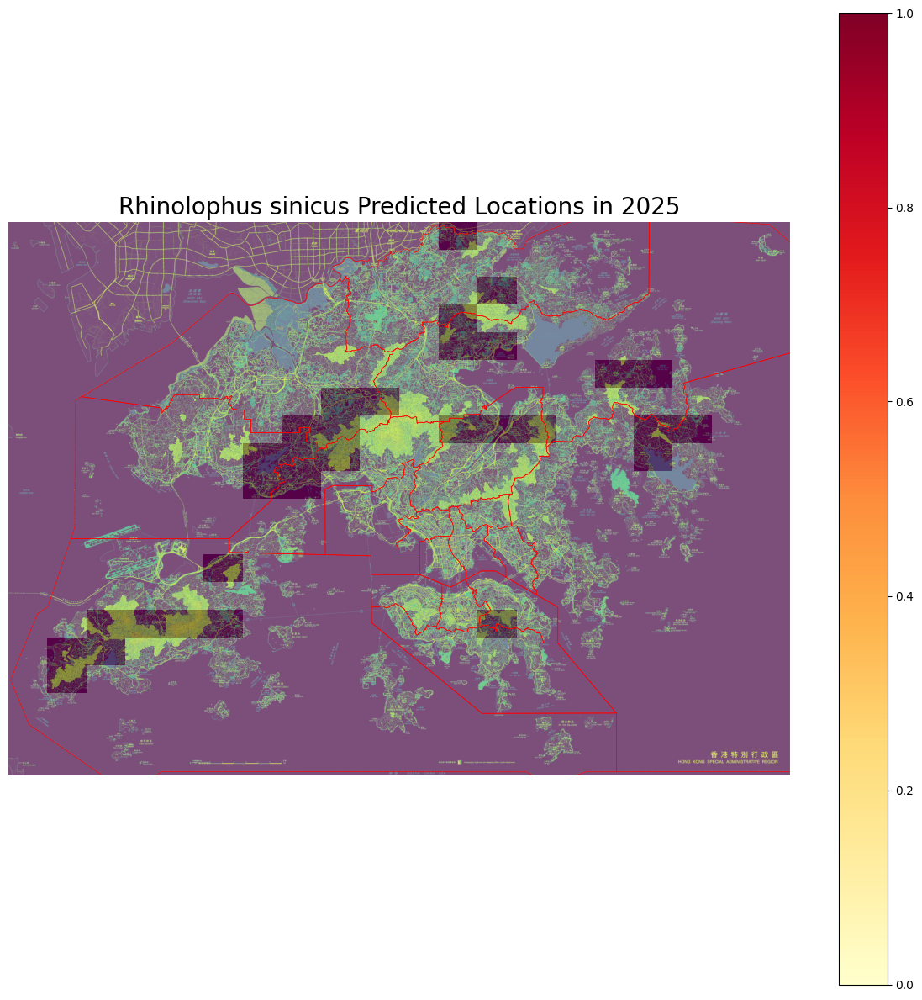

In [22]:
a_species = 'Rhinolophus sinicus' # 'Agropsar philippensis'
print("Occurrences:", species_layers[a_species].sum())

trained_model = train_model(a_species)
grid_cells_gdf = inference_model(a_species, trained_model)

# Convolutional Neural Network

In [ ]:
def device_setup(model_class):
    # initialize the NN
    model = model_class
    print(model)
    # Use GPU if possible
    device = torch.device("cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu")
    model.to(device)
    print(device)
    return model, device

def loss_optimiser_setup(criterion, optimiser):
    return criterion, optimiser

def dataset_setup(a_species):
    # Define species
    the_species = a_species
    species_layer = species_layers[the_species]
    a_X_train = torch.tensor(species_layer[:22, :, :]).to(torch.float32).reshape(1, 22, 1, 20, 20) # (B, T, C, H, W) # (1, 22, 20, 20)
    a_y_train = torch.tensor(species_layer[22, :, :]).to(torch.float32).reshape(1, 1, 20, 20) # (1, -1) # (1, 1, 20, 20)
    a_X_val = torch.tensor(species_layer[1:23, :, :]).to(torch.float32).reshape(1, 22, 1, 20, 20)
    a_y_val = torch.tensor(species_layer[23, :, :]).to(torch.float32).reshape(1, 1, 20, 20)
    print("X_train", a_X_train.shape)
    print("y_train", a_y_train.shape)
    print("X_val", a_X_val.shape)
    print("y_val", a_y_val.shape)
    return a_X_train, a_y_train, a_X_val, a_y_val

def train_setup(model, a_X_train, a_y_train, criterion, optimizer, device, epochs=5):
    # number of epochs to train the model
    n_epochs = epochs  # 5 for fast demo, suggest training between 20-50 epochs
    best_loss = 0.
    early_stopping_counter = 0
    model.train()  # prep model for training
    for epoch in range(n_epochs):
        # monitor training loss
        train_loss = 0.0
        
        ###################
        # train the model #
        ###################
        # data need to be the same device as the model
        data = a_X_train.to(device)
        target = a_y_train.to(device)    
        # clear the gradients of all optimized variables
        optimizer.zero_grad()
        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)[1][-1][0] # last hidden state # model(data) 

        # calculate the loss
        loss = criterion(output, target)
        # backward pass: compute gradient of the loss with respect to model parameters
        loss.backward()
        # perform a single optimization step (parameter update)
        optimizer.step()
        # update running training loss
        train_loss += loss.item()
            
        # print training statistics 
        print('Epoch: {} \tTraining Loss: {:.6f}'.format(
            epoch+1, 
            train_loss
            ))
        
        # Early stopping
        if epoch == 0:
            best_loss = train_loss
        if train_loss > best_loss:
            early_stopping_counter += 1
        else:
            early_stopping_counter = 0
            best_loss = train_loss
        if early_stopping_counter == 5:
            print("Early stopping triggered.")
            break
    return model

def val_setup(model, a_X_val, a_y_val, criterion, device):
    # monitor test loss
    # initialize lists to monitor test loss and accuracy
    test_loss = 0.0

    model.eval() # prep model for *evaluation*
    with torch.no_grad():  # turn off gradient to save memory
        # data need to be the same device as the model
        data = a_X_val.to(device)
        target = a_y_val.to(device)
        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)[1][-1][0] # last hidden state # model(data) 
        # calculate the loss
        loss = criterion(output, target)
        # update test loss 
        test_loss += loss.item()
        # convert output probabilities to predicted class
        _, pred = torch.max(output, 1)

    # calculate and print avg test loss
    print('Test Loss: {:.6f}\n'.format(test_loss))

    return model, output

def test_setup(model, a_species, device):
    # Inference for the year 2025
    species_layer = species_layers[a_species]
    # Define device
    model.eval()
    with torch.no_grad():
        test_data = torch.tensor(species_layer[-species_layer.shape[0]+2:, :, :]).unsqueeze(0).unsqueeze(2).to(torch.float32).to(device)
        test_output = model(test_data)[1][-1][0] # last hidden state # model(test_data)

    return test_output

def prediction_setup(output):
    # reshape output to 20x20 grid
    return output.reshape(20, 20)

def inference_setup(y_pred_val):
    # Create a GeoDataFrame - each row contains grid id, geometry (box), and prediction (0 for now)
    grid_cells_boxes_species = []
    for i in range(400):
        grid_cells_boxes_species.append({'id': i,
                                            'geometry': grid_cells_boxes[i],
                                            'prediction': 0})

    # Add prediction count
    for i in range(20): # y
        for j in range(20): # x
            # if y_pred_val[y_pred_val.shape[0]-1-i, j] > 1:
            #     grid_cells_boxes_species[i * 20 + j]['prediction'] += 1

            grid_cells_boxes_species[i * 20 + j]['prediction'] += (y_pred_val[y_pred_val.shape[0]-1-i, j]).cpu().numpy()

            # if y_pred_val[y_pred_val.shape[0]-1-i, j] > 0:
            #     grid_cells_boxes_species[i * 20 + j]['prediction'] += (y_pred_val[y_pred_val.shape[0]-1-i, j]).cpu().numpy()

    for i in range(400):
        if grid_cells_boxes_species[i]['prediction'] < 0:
            grid_cells_boxes_species[i]['prediction'] = 0

    # Turn into GeoDataFrame
    grid_cells_gdf = gpd.GeoDataFrame(grid_cells_boxes_species, crs=hkmap.crs, geometry='geometry')
    return grid_cells_gdf

def visualise_setup(grid_cells_gdf, a_species, val=True):
    # Visualise the centroids on the map
    fig, ax = plt.subplots(figsize=(15, 15))
    ax.imshow(hkmap_array, extent=extent, origin='upper', vmin=hkmap_array.min(), vmax=hkmap_array.max())
    districts.boundary.plot(ax=ax, color='red', linewidth=0.5)
    grid_cells_gdf.plot(ax=ax, linewidth=.1, column='prediction', cmap='YlOrRd', alpha=.3) # facecolor='yellow', edgecolor='blue',
    if val:
        species_df.loc[(species_df['scientific'] == a_species) & (species_df['year'] == 2024)].plot(ax=ax, color='blue', markersize=5, label='Actual Occurrences')
        plt.title(f"{a_species} Validating Predicted Locations in 2024", fontsize=20)
    else:
        plt.title(f"{a_species} Predicted Locations in 2025", fontsize=20)
    ax.set_axis_off()
    ax.set(xlim=(bound_left, bound_right), ylim=(bound_bottom, bound_top))
    plt.show()

## CNN Architecture

In [24]:
import torch.nn as nn
import torch.nn.functional as F

## Define the CNN architecture for 20x20 grid cells and 22 years of data
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Conv2d(in_channels=22, out_channels=11, kernel_size=7, stride=1, padding=3)
        self.conv2 = nn.Conv2d(in_channels=11, out_channels=3, kernel_size=7, stride=1, padding=3)
        self.fc1 = nn.Linear(self.conv2.out_channels*20*20, 1024)
        self.fc2 = nn.Linear(1024, 20*20)

    def forward(self, x):
        x = self.conv1(x)
        x = F.sigmoid(x)
        x = self.conv2(x)
        x = F.sigmoid(x)
        x = x.flatten(start_dim=1)
        x = self.fc1(x)
        x = F.sigmoid(x)
        x = self.fc2(x)

        # out = F.softmax(x, dim=1) # Optional for PyTorch as softmax is included in the loss function
        return x#out

In [53]:
class ConvLSTMCell(nn.Module):

    def __init__(self, input_dim, hidden_dim, kernel_size, bias):
        """
        Initialize ConvLSTM cell.

        Parameters
        ----------
        input_dim: int
            Number of channels of input tensor.
        hidden_dim: int
            Number of channels of hidden state.
        kernel_size: (int, int)
            Size of the convolutional kernel.
        bias: bool
            Whether or not to add the bias.
        """

        super(ConvLSTMCell, self).__init__()

        self.input_dim = input_dim
        self.hidden_dim = hidden_dim

        self.kernel_size = kernel_size
        self.padding = kernel_size[0] // 2, kernel_size[1] // 2
        self.bias = bias

        self.conv = nn.Conv2d(in_channels=self.input_dim + self.hidden_dim,
                              out_channels=4 * self.hidden_dim,
                              kernel_size=self.kernel_size,
                              padding=self.padding,
                              bias=self.bias)

    def forward(self, input_tensor, cur_state):
        h_cur, c_cur = cur_state

        combined = torch.cat([input_tensor, h_cur], dim=1)  # concatenate along channel axis

        combined_conv = self.conv(combined)
        cc_i, cc_f, cc_o, cc_g = torch.split(combined_conv, self.hidden_dim, dim=1)
        i = torch.sigmoid(cc_i)
        f = torch.sigmoid(cc_f)
        o = torch.sigmoid(cc_o)
        g = torch.tanh(cc_g)

        c_next = f * c_cur + i * g
        h_next = o * torch.tanh(c_next)

        return h_next, c_next

    def init_hidden(self, batch_size, image_size):
        height, width = image_size
        return (torch.zeros(batch_size, self.hidden_dim, height, width, device=self.conv.weight.device),
                torch.zeros(batch_size, self.hidden_dim, height, width, device=self.conv.weight.device))


class ConvLSTM(nn.Module):

    """

    Parameters:
        input_dim: Number of channels in input
        hidden_dim: Number of hidden channels
        kernel_size: Size of kernel in convolutions
        num_layers: Number of LSTM layers stacked on each other
        batch_first: Whether or not dimension 0 is the batch or not
        bias: Bias or no bias in Convolution
        return_all_layers: Return the list of computations for all layers
        Note: Will do same padding.

    Input:
        A tensor of size B, T, C, H, W or T, B, C, H, W
    Output:
        A tuple of two lists of length num_layers (or length 1 if return_all_layers is False).
            0 - layer_output_list is the list of lists of length T of each output
            1 - last_state_list is the list of last states
                    each element of the list is a tuple (h, c) for hidden state and memory
    Example:
        >> x = torch.rand((32, 10, 64, 128, 128))
        >> convlstm = ConvLSTM(64, 16, 3, 1, True, True, False)
        >> _, last_states = convlstm(x)
        >> h = last_states[0][0]  # 0 for layer index, 0 for h index
    """

    def __init__(self, input_dim, hidden_dim, kernel_size, num_layers,
                 batch_first=False, bias=True, return_all_layers=False):
        super(ConvLSTM, self).__init__()

        self._check_kernel_size_consistency(kernel_size)

        # Make sure that both `kernel_size` and `hidden_dim` are lists having len == num_layers
        kernel_size = self._extend_for_multilayer(kernel_size, num_layers)
        hidden_dim = self._extend_for_multilayer(hidden_dim, num_layers)
        if not len(kernel_size) == len(hidden_dim) == num_layers:
            raise ValueError('Inconsistent list length.')

        self.input_dim = input_dim
        self.hidden_dim = hidden_dim
        self.kernel_size = kernel_size
        self.num_layers = num_layers
        self.batch_first = batch_first
        self.bias = bias
        self.return_all_layers = return_all_layers

        cell_list = []
        for i in range(0, self.num_layers):
            cur_input_dim = self.input_dim if i == 0 else self.hidden_dim[i - 1]

            cell_list.append(ConvLSTMCell(input_dim=cur_input_dim,
                                          hidden_dim=self.hidden_dim[i],
                                          kernel_size=self.kernel_size[i],
                                          bias=self.bias))

        self.cell_list = nn.ModuleList(cell_list)

    def forward(self, input_tensor, hidden_state=None):
        """

        Parameters
        ----------
        input_tensor: todo
            5-D Tensor either of shape (t, b, c, h, w) or (b, t, c, h, w)
        hidden_state: todo
            None. todo implement stateful

        Returns
        -------
        last_state_list, layer_output
        """
        if not self.batch_first:
            # (t, b, c, h, w) -> (b, t, c, h, w)
            input_tensor = input_tensor.permute(1, 0, 2, 3, 4)

        b, _, _, h, w = input_tensor.size()

        # Implement stateful ConvLSTM
        if hidden_state is not None:
            raise NotImplementedError()
        else:
            # Since the init is done in forward. Can send image size here
            hidden_state = self._init_hidden(batch_size=b,
                                             image_size=(h, w))

        layer_output_list = []
        last_state_list = []

        seq_len = input_tensor.size(1)
        cur_layer_input = input_tensor

        for layer_idx in range(self.num_layers):

            h, c = hidden_state[layer_idx]
            output_inner = []
            for t in range(seq_len):
                h, c = self.cell_list[layer_idx](input_tensor=cur_layer_input[:, t, :, :, :],
                                                 cur_state=[h, c])
                output_inner.append(h)

            layer_output = torch.stack(output_inner, dim=1)
            cur_layer_input = layer_output

            layer_output_list.append(layer_output)
            last_state_list.append([h, c])

        if not self.return_all_layers:
            layer_output_list = layer_output_list[-1:]
            last_state_list = last_state_list[-1:]

        return layer_output_list, last_state_list

    def _init_hidden(self, batch_size, image_size):
        init_states = []
        for i in range(self.num_layers):
            init_states.append(self.cell_list[i].init_hidden(batch_size, image_size))
        return init_states

    @staticmethod
    def _check_kernel_size_consistency(kernel_size):
        if not (isinstance(kernel_size, tuple) or
                (isinstance(kernel_size, list) and all([isinstance(elem, tuple) for elem in kernel_size]))):
            raise ValueError('`kernel_size` must be tuple or list of tuples')

    @staticmethod
    def _extend_for_multilayer(param, num_layers):
        if not isinstance(param, list):
            param = [param] * num_layers
        return param

## Training and Inference

### CNN (DEPRECATED)

In [29]:
## Specify loss and optimization functions
model, device = device_setup(Net())
# specify loss function
# specify optimiser
# Use ADAM with learning rate 0.01 (we will talk about SGD next time)
criterion, optimizer = loss_optimiser_setup(nn.CrossEntropyLoss(), torch.optim.Adam(model.parameters(), lr=0.001))
# Define species and prepare dataset
a_species = 'Sphenomorphus incognitus'
a_X_train, a_y_train, a_X_val, a_y_val = dataset_setup(a_species)
# Train the model
epochs = 100
model = train_setup(model, a_X_train, a_y_train, criterion, optimizer, device, epochs)
# Evaluate on validation set (Target: second last available year)
model, output = val_setup(model, a_X_val, a_y_val, criterion, device)
# Get prediction in 20x20 grid
y_pred_val = prediction_setup(output)
# Get GeoDataFrame for visualisation
grid_cells_gdf = inference_setup(y_pred_val)
# Visualise predicted grid cells with intensity
visualise_setup(grid_cells_gdf, a_species)

Net(
  (conv1): Conv2d(22, 11, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3))
  (conv2): Conv2d(11, 3, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3))
  (fc1): Linear(in_features=1200, out_features=1024, bias=True)
  (fc2): Linear(in_features=1024, out_features=400, bias=True)
)
mps
X_train torch.Size([1, 22, 1, 20, 20])
y_train torch.Size([1, 20, 20])
X_val torch.Size([1, 22, 1, 20, 20])
y_val torch.Size([1, 20, 20])


RuntimeError: Expected 3D (unbatched) or 4D (batched) input to conv2d, but got input of size: [1, 22, 1, 20, 20]

-22


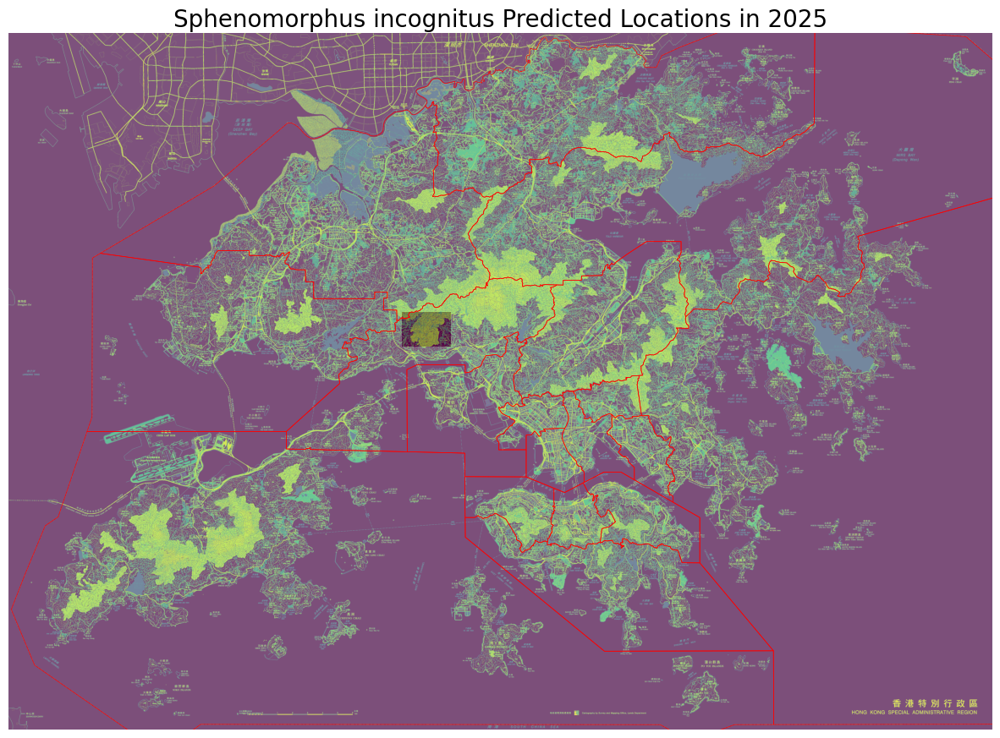

In [154]:
output = test_setup(model, a_species, device)
y_pred_test = prediction_setup(output)
grid_cells_gdf = inference_setup(y_pred_test)
visualise_setup(grid_cells_gdf, a_species, val=False)

### CNN-LSTM

In [ ]:
import random
import os

def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    # Ensure deterministic behavior in cudnn
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    os.environ["CUBLAS_WORKSPACE_CONFIG"] = ":16:8"

torch.use_deterministic_algorithms(True)

ConvLSTM(
  (cell_list): ModuleList(
    (0): ConvLSTMCell(
      (conv): Conv2d(2, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    )
  )
)
mps
X_train torch.Size([1, 22, 1, 20, 20])
y_train torch.Size([1, 1, 20, 20])
X_val torch.Size([1, 22, 1, 20, 20])
y_val torch.Size([1, 1, 20, 20])
Epoch: 1 	Training Loss: 3.554272
Epoch: 2 	Training Loss: 3.553868
Epoch: 3 	Training Loss: 3.553555
Epoch: 4 	Training Loss: 3.553314
Epoch: 5 	Training Loss: 3.553132
Epoch: 6 	Training Loss: 3.552997
Epoch: 7 	Training Loss: 3.552898
Epoch: 8 	Training Loss: 3.552828
Epoch: 9 	Training Loss: 3.552778
Epoch: 10 	Training Loss: 3.552744
Epoch: 11 	Training Loss: 3.552726
Epoch: 12 	Training Loss: 3.552720
Epoch: 13 	Training Loss: 3.552727
Epoch: 14 	Training Loss: 3.552745
Epoch: 15 	Training Loss: 3.552776
Epoch: 16 	Training Loss: 3.552817
Epoch: 17 	Training Loss: 3.552869
Early stopping triggered.
Test Loss: 2.330221



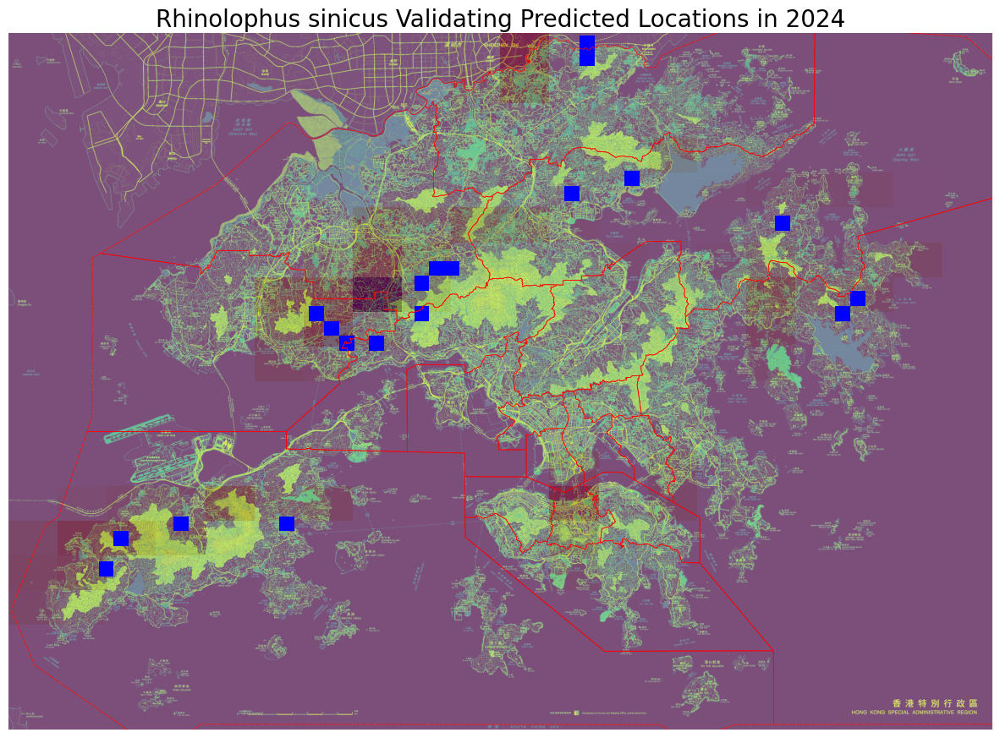

In [56]:
set_seed(48)
model = ConvLSTM(input_dim=1,
                 hidden_dim=1,
                 kernel_size=(3, 3),
                 num_layers=1,
                 batch_first=True,
                 bias=True,
                 return_all_layers=False)

## Specify loss and optimization functions
model, device = device_setup(model) #(Net())
# specify loss function
# specify optimiser
# Use ADAM with learning rate 0.01 (we will talk about SGD next time)
criterion, optimizer = loss_optimiser_setup(nn.BCELoss(), torch.optim.Adam(model.parameters(), lr=0.001)) # CrossEntropyLoss
# Define species and prepare dataset
a_species = 'Rhinolophus sinicus' # 'Rhinolophus sinicus'
a_X_train, a_y_train, a_X_val, a_y_val = dataset_setup(a_species)
# Train the model
epochs = 100
model = train_setup(model, a_X_train, a_y_train, criterion, optimizer, device, epochs)
# Evaluate on validation set (Target: second last available year)
model, output = val_setup(model, a_X_val, a_y_val, criterion, device)
output = output[:, -1, :, :]
# Get prediction in 20x20 grid
y_pred_val = prediction_setup(output)
# Get GeoDataFrame for visualisation
grid_cells_gdf = inference_setup(y_pred_val)
# Visualise predicted grid cells with intensity
visualise_setup(grid_cells_gdf, a_species)

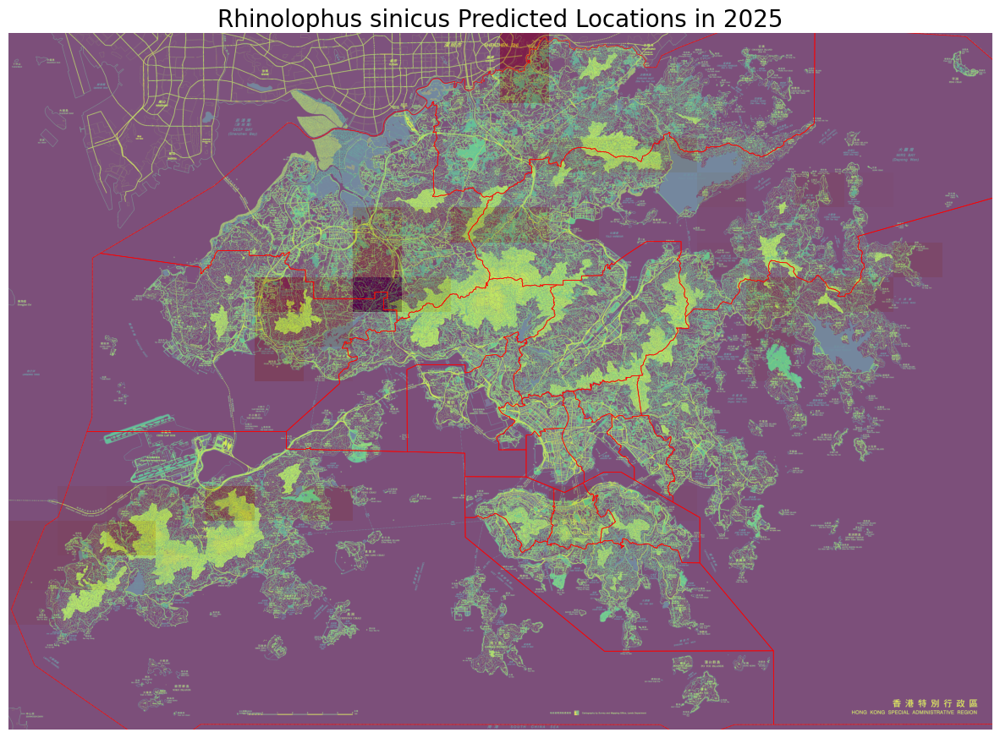

In [ ]:
# 2025 prediction
output = test_setup(model, a_species, device)
output = output[:, -1, :, :]
y_pred_test = prediction_setup(output)
grid_cells_gdf = inference_setup(y_pred_test)
visualise_setup(grid_cells_gdf, a_species, val=False)

# *VISUALISATION SAMPLE*

In [149]:
def visualise_species_year(a_species, year):
    # Visualise the centroids on the map
    fig, ax = plt.subplots(figsize=(15, 15))
    ax.imshow(hkmap_array, extent=extent, origin='upper', vmin=hkmap_array.min(), vmax=hkmap_array.max())
    districts.boundary.plot(ax=ax, color='red', linewidth=0.5)
    species_df.loc[(species_df['scientific'] == a_species) & (species_df['year'].isin(year))].plot(ax=ax, color='blue', markersize=5, label='Actual Occurrences')
    plt.title(f"{a_species} Validating Predicted Locations in {year}", fontsize=20)

    ax.set_axis_off()
    ax.set(xlim=(bound_left, bound_right), ylim=(bound_bottom, bound_top))
    plt.show()

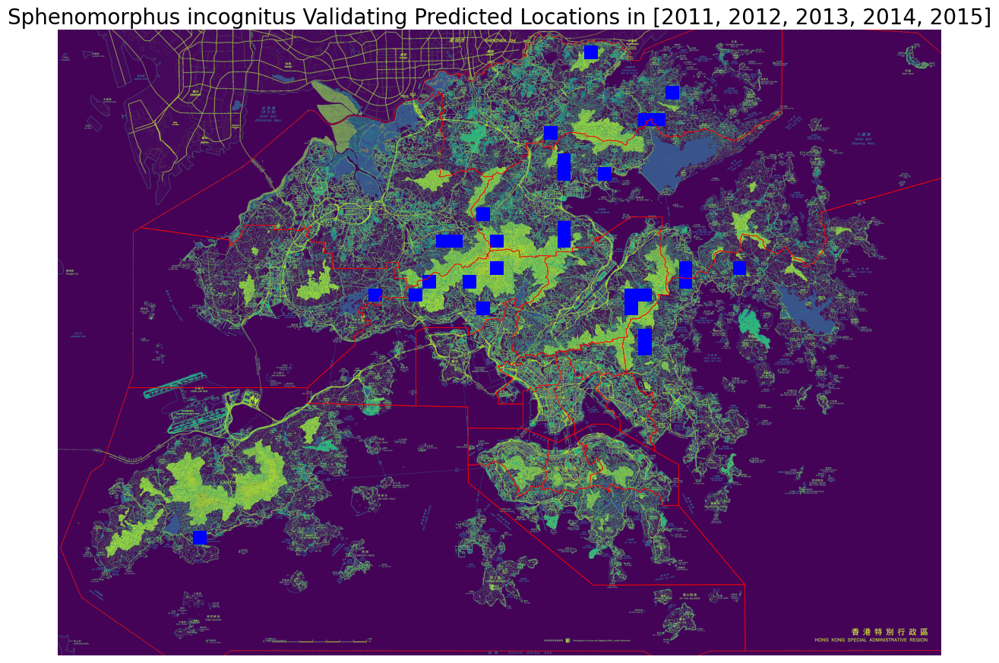

In [150]:
visualise_species_year(a_species, [2011, 2012, 2013, 2014, 2015])